# Color Composites

Remotely sensed imagery often contains data from multiple spectral bands, and multi-band color composites help us visualize that data by assigning a different color to each band. `wxee` makes it easy to generate static or interactive color composites from `xarray` datasets using the `rgb` method.

## Setup

Setup is similar to other tutorials with one exception. Interactive plots rely on [hvplot](https://github.com/holoviz/hvplot) which is an optional dependency of `wxee`, so make sure that's installed.

In [ ]:
!pip install wxee
!pip install hvplot

In [1]:
import ee
import wxee

ee.Authenticate()
wxee.Initialize()

## Downloading a Dataset

To demonstrate the `rgb` method, we'll download a time series of multispectral data from Sentinel-2 over Spirit Lake, Washington. When Mount St. Helens erupted in 1980, trees from the surrounding forest were blown into Spirit Lake. Many of them still float there, pushed back and forth by seasonal winds. That should make for an interesting time series!

In [2]:
geom = ee.Geometry.Polygon(
        [[[-122.18605629604276, 46.304892727612064],
          [-122.18605629604276, 46.243667518203395],
          [-122.09301582973417, 46.243667518203395],
          [-122.09301582973417, 46.304892727612064]]])

First, we'll create a one-month time series of Sentinel-2 data over the lake, selecting the visible, NIR, and SWIR bands. We'll filter by cloud cover to get rid of any images that are too cloudy.

In [3]:
ts = (wxee.TimeSeries("COPERNICUS/S2_SR")
    .select(["B4", "B3", "B2", "B8", "B11"])
    .filterDate("2020-08", "2020-09")
    .filterBounds(geom)
    .filterMetadata("CLOUDY_PIXEL_PERCENTAGE", "less_than", 20))

And download to an `xarray` dataset at 20m resolution.

In [4]:
ds = ts.wx.to_xarray(region=geom, scale=20)

Requesting data:   0%|          | 0/8 [00:00<?, ?it/s]

## Visualization

### The `rgb` Method

Let's see how the `rgb` method works by accessing it through the `wx` accessor and running it with default settings.

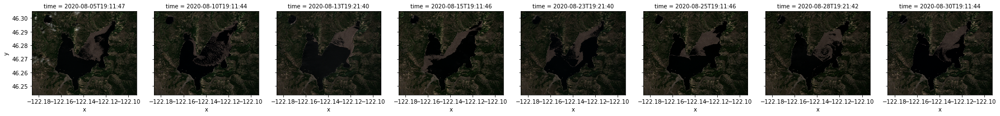

In [5]:
ds.wx.rgb()

Each of the 8 images in our time series if plotted, automatically faceted by the time dimension. They're a little dark and a little small, so let's fix that.

### Stretching and Other Parameters

The `stretch` parameter applies a percentile stretch that can make it easier to see details. Also, `rgb` accepts any keyword arguments and passes them along to the plotting function--in this case, `xarray.Dataset.plot`--so we'll use the `col_wrap` parameter to make the plots a little larger. Other parameters for the plotting function can be found [here](http://xarray.pydata.org/en/stable/generated/xarray.DataArray.plot.html).

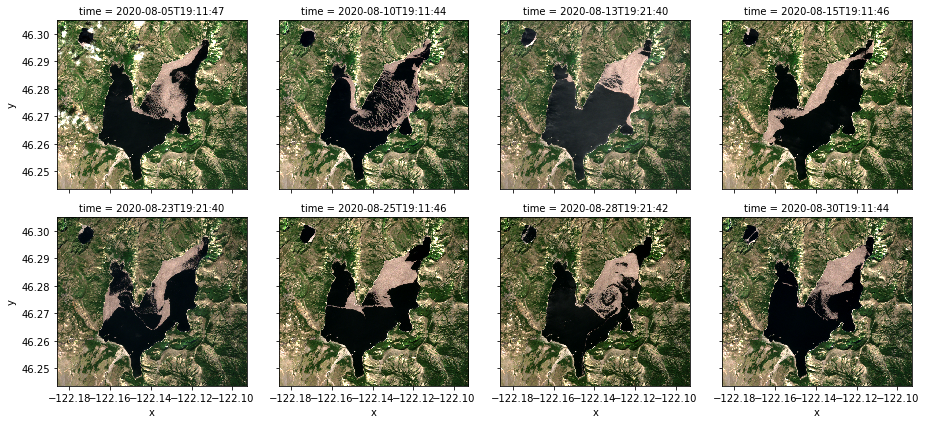

In [6]:
ds.wx.rgb(stretch=0.99, col_wrap=4)

Much better! But what bands is it using? 

### Specifying Band Combinations

By default, the `rgb` method takes the first 3 bands in order as the red, green, and blue channels. Because we downloaded our Sentinel-2 imagery with red, green, blue, NIR, and SWIR bands (in that order), we're seeing a true color composite. We can modify that by passing a list of 3 bands to the `bands` parameter. Let's try SWIR-NIR-Red.

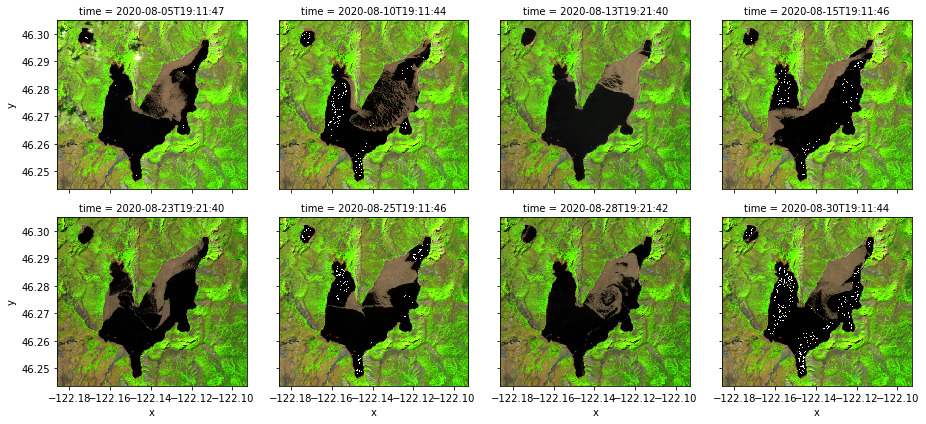

In [7]:
bands = ["B11", "B8", "B4"]

ds.wx.rgb(bands=bands, stretch=0.99, col_wrap=4)

### Interactive Plots

So far we've just looked at static plots, but `rgb` can also create interactive plots using the `interactive` argument. With an interactive plot, additional arguments are passed to `xarray.DataAarray.hvplot.rgb`, so we no longer need `col_wrap`. Instead, we'll specify an `aspect` and a `frame_width` to change the aspect ratio and size of the plot. More details on the `hvplot` arguments can be found [here](https://hvplot.holoviz.org/reference/xarray/rgb.html). 

In [8]:
bands = ["B11", "B8", "B4"]

ds.wx.rgb(bands=bands, stretch=0.99, interactive=True, aspect=1.2, frame_width=600)

Column
    [0] HoloViews(DynamicMap, widget_location='bottom', widget_type='scrubber')
    [1] Row
        [0] HSpacer()
        [1] WidgetBox
            [0] Player(end=7, width=550)
        [2] HSpacer()